In [1]:
import torch
print(torch.__version__)  # Check PyTorch version
print(torch.cuda.is_available())  # Should return True if CUDA is available
print(torch.cuda.get_device_name(0))  # Get the name of the GPU (if using GPU)


2.5.1+cu121
True
NVIDIA RTX A2000 8GB Laptop GPU


In [4]:
pip install ultralytics opencv-python torch numpy

  Using cached opencv_python-4.10.0.84-cp37-abi3-win_amd64.whl.metadata (20 kB)
   ---------------------------------------- 0.0/901.3 kB ? eta -:--:--
   --------------------------------------- 901.3/901.3 kB 13.6 MB/s eta 0:00:00
Using cached opencv_python-4.10.0.84-cp37-abi3-win_amd64.whl (38.8 MB)
Note: you may need to restart the kernel to use updated packages.


## try 1 "accident_detection_output"

In [5]:
import cv2
import numpy as np
import torch
from ultralytics import YOLO
import math

class RoadAccidentDetector:
    def __init__(self, 
                 object_detection_model='yolov8n.pt',
                 confidence_threshold=0.5,
                 iou_threshold=0.5):
        """
        Advanced Road Accident Detection System
        
        Args:
            object_detection_model (str): Path to pre-trained YOLO model
            confidence_threshold (float): Minimum confidence for detection
            iou_threshold (float): Intersection over Union threshold
        """
        # Load YOLO model
        self.model = YOLO(object_detection_model)
        
        # Predefined vehicle and person classes
        self.vehicle_classes = [
            'car', 'truck', 'bus', 'motorcycle', 'bicycle'
        ]
        self.person_classes = ['person']
        
        # Detection parameters
        self.confidence_threshold = confidence_threshold
        self.iou_threshold = iou_threshold
        
        # Accident detection parameters
        self.proximity_threshold = 50  # pixels
        self.collision_history = []
        self.collision_threshold = 5  # frames to confirm collision

    def calculate_center(self, bbox):
        """
        Calculate center point of bounding box
        
        Args:
            bbox (list): Bounding box coordinates [x1, y1, x2, y2]
        
        Returns:
            tuple: Center coordinates (x, y)
        """
        x1, y1, x2, y2 = bbox
        return ((x1 + x2) // 2, (y1 + y2) // 2)

    def calculate_distance(self, point1, point2):
        """
        Calculate Euclidean distance between two points
        
        Args:
            point1 (tuple): First point coordinates
            point2 (tuple): Second point coordinates
        
        Returns:
            float: Distance between points
        """
        return math.sqrt((point1[0] - point2[0])**2 + (point1[1] - point2[1])**2)

    def detect_potential_accidents(self, frame, results):
        """
        Detect potential accidents by analyzing object interactions
        
        Args:
            frame (numpy.ndarray): Input video frame
            results (list): YOLO detection results
        
        Returns:
            bool: Whether an accident is detected
        """
        vehicles = []
        people = []
        
        # Separate vehicles and people
        for result in results:
            boxes = result.boxes.xyxy.cpu().numpy()
            classes = result.boxes.cls.cpu().numpy()
            confidences = result.boxes.conf.cpu().numpy()
            
            for box, cls, conf in zip(boxes, classes, confidences):
                class_name = self.model.names[int(cls)]
                
                if class_name in self.vehicle_classes and conf > self.confidence_threshold:
                    vehicles.append((box, class_name))
                elif class_name in self.person_classes and conf > self.confidence_threshold:
                    people.append(box)
        
        # Check for potential collisions
        collision_detected = False
        
        # Vehicle to Vehicle Collision
        for i, (vehicle1, _) in enumerate(vehicles):
            for j, (vehicle2, _) in enumerate(vehicles[i+1:]):
                v1_center = self.calculate_center(vehicle1)
                v2_center = self.calculate_center(vehicle2)
                
                distance = self.calculate_distance(v1_center, v2_center)
                
                # Check if vehicles are too close
                if distance < self.proximity_threshold:
                    collision_detected = True
                    break
            
            if collision_detected:
                break
        
        # Vehicle to Person Collision
        if not collision_detected:
            for vehicle, _ in vehicles:
                v_center = self.calculate_center(vehicle)
                
                for person in people:
                    p_center = self.calculate_center(person)
                    
                    distance = self.calculate_distance(v_center, p_center)
                    
                    # Check if vehicle is extremely close to person
                    if distance < self.proximity_threshold:
                        collision_detected = True
                        break
                
                if collision_detected:
                    break
        
        # Track collision history for more robust detection
        self.collision_history.append(collision_detected)
        self.collision_history = self.collision_history[-self.collision_threshold:]
        
        return sum(self.collision_history) >= self.collision_threshold // 2

    def process_video(self, video_path, output_path):
        """
        Process input video and detect accidents
        
        Args:
            video_path (str): Path to input video
            output_path (str): Path to output video
        """
        # Open video capture
        cap = cv2.VideoCapture(video_path)
        
        # Video writer
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = cap.get(cv2.CAP_PROP_FPS)
        
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
        
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            
            # Run YOLO detection
            results = self.model(frame, stream=True)
            
            # Annotate frame with detections
            for r in results:
                boxes = r.boxes
                
                # Draw bounding boxes for all detections
                for box in boxes:
                    # Get box coordinates
                    x1, y1, x2, y2 = box.xyxy[0]
                    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
                    
                    # Get class and confidence
                    cls = int(box.cls[0])
                    conf = float(box.conf[0])
                    class_name = self.model.names[cls]
                    
                    # Draw box if above confidence threshold
                    if conf > self.confidence_threshold:
                        color = (0, 255, 0)  # Default green
                        
                        # Different colors for different classes
                        if class_name in self.vehicle_classes:
                            color = (255, 0, 0)  # Blue for vehicles
                        elif class_name in self.person_classes:
                            color = (0, 0, 255)  # Red for people
                        
                        cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                        label = f'{class_name} {conf:.2f}'
                        cv2.putText(frame, label, (x1, y1-10), 
                                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
            
            # Detect potential accidents
            accident_detected = self.detect_potential_accidents(frame, results)
            
            # Display accident warning
            if accident_detected:
                cv2.putText(frame, "ACCIDENT DETECTED!", (50, 100), 
                            cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 5)
            
            # Write frame to output video
            out.write(frame)
        
        # Release resources
        cap.release()
        out.release()

def main():
    # Initialize detector
    detector = RoadAccidentDetector(
        object_detection_model='yolov8l.pt',  # You can change to yolov8m.pt or yolov8l.pt for higher accuracy
        confidence_threshold=0.5,
        iou_threshold=0.5
    )
    
    # Process video
    detector.process_video(
        video_path='C:/Users/DELL/Desktop/accident detection/peopleaccident.mp4',
        output_path='C:/Users/DELL/Desktop/accident detection/accident_detection_output.mp4'
    )

if __name__ == "__main__":
    main()

# Installation Requirements (run in terminal/notebook)
# pip install ultralytics opencv-python torch numpy

Creating new Ultralytics Settings v0.0.6 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\DELL\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 83.7M/83.7M [00:04<00:00, 21.8MB/s]



0: 384x640 6 persons, 12 cars, 2 motorcycles, 3 trucks, 49.4ms
Speed: 0.0ms preprocess, 49.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 11 cars, 2 motorcycles, 3 trucks, 18.3ms
Speed: 0.0ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 11 cars, 2 motorcycles, 3 trucks, 19.4ms
Speed: 0.0ms preprocess, 19.4ms inference, 9.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 11 cars, 2 motorcycles, 3 trucks, 24.8ms
Speed: 0.0ms preprocess, 24.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 11 cars, 1 motorcycle, 4 trucks, 21.6ms
Speed: 7.9ms preprocess, 21.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 11 cars, 1 motorcycle, 3 trucks, 26.2ms
Speed: 0.0ms preprocess, 26.2ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 11 cars, 1 mo

## try 2 "output_with_collisions.mp4"

In [4]:
pip install opencv-python torch torchvision yolov5 numpy pillow


  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/953.5 kB ? eta -:--:--
   --------------------------------------- 953.5/953.5 kB 11.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ----- ---------------------------------- 5.0/38.8 MB 23.2 MB/s eta 0:00:02
   ---------- ----------------------------- 10.0/38.8 MB 23.9 MB/s eta 0:00:02
   ----------------- ---------------------- 16.8/38.8 MB 27.1 MB/s eta 0:00:01
   ---------------------- ----------------- 22.0/38.8 MB 26.8 MB/s eta 0:00:01
   --------------------------- ------------ 27.0/38.8 MB 26.7 MB/s eta 0:00:01
   ---------------------------------- ----- 33.8/38.8 MB 27.5 MB/s eta 0:00:01
   ---------------------------------------  38.5/38.8 MB 27.5 MB/s eta 0:00:01
   ---------------------------------------- 38.8/38.8 MB 26.8 MB/s eta 0:00:00
   ---------------------------------------- 0.

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
aiobotocore 2.12.3 requires botocore<1.34.70,>=1.34.41, but you have botocore 1.35.83 which is incompatible.


In [1]:
import torch
from pathlib import Path

# Load pre-trained YOLOv5 model (e.g., YOLOv5s for smaller, faster performance)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')


Using cache found in C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-12-17 Python-3.12.7 torch-2.5.1+cu121 CUDA:0 (NVIDIA RTX A2000 8GB Laptop GPU, 8192MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
import cv2

# Open the video file
cap = cv2.VideoCapture('C:/Users/DELL/Desktop/accident detection/accident3.mp4')

# Check if the video opened successfully
if not cap.isOpened():
    print("Error opening video stream or file")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Detect objects in the current frame
    results = model(frame)
    
    # Display results
    results.show()  # Shows the image with bounding boxes drawn

    # Process the results (bounding boxes, classes, and confidences)
    predictions = results.xyxy[0].cpu().numpy()  # x1, y1, x2, y2, confidence, class
    for pred in predictions:
        x1, y1, x2, y2, conf, cls = pred
        if cls == 0:  # Class 0 is 'person'
            print(f"Person detected at ({x1}, {y1}), ({x2}, {y2})")
        elif cls in [2, 3, 5, 7]:  # Class 2 = car, 3 = motorcycle, 5 = bus, 7 = truck
            print(f"Vehicle detected at ({x1}, {y1}), ({x2}, {y2})")
    
    # Stop on keypress
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


In [2]:
def iou(box1, box2):
    # box = [x1, y1, x2, y2]
    x1, y1, x2, y2 = box1
    x1b, y1b, x2b, y2b = box2

    # Calculate the area of the intersection rectangle
    inter_x1 = max(x1, x1b)
    inter_y1 = max(y1, y1b)
    inter_x2 = min(x2, x2b)
    inter_y2 = min(y2, y2b)

    # No intersection
    if inter_x2 <= inter_x1 or inter_y2 <= inter_y1:
        return 0

    # Area of intersection
    inter_area = (inter_x2 - inter_x1) * (inter_y2 - inter_y1)

    # Area of both boxes
    box1_area = (x2 - x1) * (y2 - y1)
    box2_area = (x2b - x1b) * (y2b - y1b)

    # Intersection over Union
    iou_value = inter_area / (box1_area + box2_area - inter_area)
    return iou_value


In [5]:
import cv2
import torch
from pathlib import Path

# Load YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # Load the YOLOv5 small model

# Open the video file
cap = cv2.VideoCapture('C:/Users/DELL/Desktop/accident detection/accident3.mp4')
collision_threshold = 0.5  # You can tune this threshold

# Get video properties to set up the output video (same resolution and FPS)
fps = cap.get(cv2.CAP_PROP_FPS)  # Frames per second
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Set up the VideoWriter to save the output video
out = cv2.VideoWriter('C:/Users/DELL/Desktop/accident detection/output_with_collisions.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

# Process each frame for collision detection
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Detect objects in the current frame
    results = model(frame)
    
    # Extract predictions (x1, y1, x2, y2, confidence, class)
    predictions = results.xyxy[0].cpu().numpy()

    people = []
    vehicles = []
    
    # Separate people and vehicles
    for pred in predictions:
        x1, y1, x2, y2, conf, cls = pred
        if cls == 0:  # Person class
            people.append((x1, y1, x2, y2))
        elif cls in [2, 3, 5, 7]:  # Vehicle classes
            vehicles.append((x1, y1, x2, y2))

    # Check for collisions
    for person in people:
        for vehicle in vehicles:
            iou_value = iou(person, vehicle)
            if iou_value > collision_threshold:
                print(f"Collision detected: Person at {person} and Vehicle at {vehicle}")
                # Optionally draw the collision area in a different color
                cv2.rectangle(frame, (int(person[0]), int(person[1])), (int(person[2]), int(person[3])), (0, 0, 255), 2)  # Red for person
                cv2.rectangle(frame, (int(vehicle[0]), int(vehicle[1])), (int(vehicle[2]), int(vehicle[3])), (0, 255, 0), 2)  # Green for vehicle

    # Show the frame with bounding boxes
    results.render()  # Draw boxes on frame
    # Write the processed frame to the output video file
    out.write(frame)

    cv2.imshow('Traffic Accident Detection', frame)

    # Break the loop if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release everything
cap.release()
out.release()
cv2.destroyAllWindows()


Using cache found in C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-12-17 Python-3.12.7 torch-2.5.1+cu121 CUDA:0 (NVIDIA RTX A2000 8GB Laptop GPU, 8192MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users

Collision detected: Person at (454.3542, 125.72048, 479.8873, 157.52411) and Vehicle at (453.37714, 127.79286, 480.5623, 157.82121)
Collision detected: Person at (454.12277, 125.69882, 479.92865, 157.59781) and Vehicle at (453.24258, 127.797714, 480.56082, 157.78458)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Collision detected: Person at (457.9015, 122.51997, 482.69382, 155.22229) and Vehicle at (457.61823, 122.89582, 484.54462, 155.53394)
Collision detected: Person at (457.94708, 122.53479, 482.74374, 155.19386) and Vehicle at (457.65997, 122.89212, 484.57867, 155.54887)
Collision detected: Person at (461.8034, 121.36452, 487.93747, 154.04146) and Vehicle at (462.15244, 121.99732, 487.97324, 154.50348)
Collision detected: Person at (461.84314, 121.34713, 487.85443, 154.07504) and Vehicle at (461.447, 121.230156, 487.74072, 153.99388)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Collision detected: Person at (464.61304, 118.76661, 491.98694, 152.51729) and Vehicle at (464.30722, 118.73087, 490.67557, 152.08566)
Collision detected: Person at (469.33188, 121.621284, 495.17114, 151.16884) and Vehicle at (468.76443, 121.06898, 495.44766, 151.18637)
Collision detected: Person at (469.34283, 121.65244, 495.17053, 151.15051) and Vehicle at (468.77026, 121.08505, 495.457, 151.19186)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (480.64786, 117.46273, 504.49374, 146.40591) and Vehicle at (480.4993, 118.58773, 505.40268, 146.51082)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (530.61383, 99.72109, 552.8322, 124.730515) and Vehicle at (530.5915, 99.730835, 552.885, 124.657036)
Collision detected: Person at (530.77814, 99.72007, 552.82043, 124.73449) and Vehicle at (530.7555, 99.72562, 552.87317, 124.66394)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (360.95416, 167.54507, 390.81143, 219.9989) and Vehicle at (362.0708, 170.52792, 393.20334, 221.79497)
Collision detected: Person at (360.95587, 167.55904, 390.81274, 220.00421) and Vehicle at (362.06372, 170.55539, 393.16977, 221.7737)
Collision detected: Person at (360.95944, 167.57167, 390.80792, 219.99532) and Vehicle at (362.06006, 170.58081, 393.15378, 221.80394)
Collision detected: Person at (360.81406, 168.32964, 390.18286, 219.62679) and Vehicle at (361.6151, 171.39713, 393.15936, 221.062)
Collision detected: Person at (360.84845, 168.43286, 388.25223, 217.96103) and Vehicle at (361.4795, 172.30878, 391.5895, 219.761)
Collision detected: Person at (360.85544, 168.44296, 388.22482, 217.99698) and Vehicle at (361.4948, 172.3371, 391.5926, 219.7802)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (360.89404, 168.52092, 388.21887, 217.97734) and Vehicle at (361.51828, 172.3607, 391.54172, 219.75784)
Collision detected: Person at (360.9912, 168.57565, 387.81302, 216.67976) and Vehicle at (361.60287, 174.79921, 391.61087, 218.74577)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (358.9515, 162.65248, 383.70892, 207.73027) and Vehicle at (359.37796, 163.03508, 385.02695, 209.32953)
Collision detected: Person at (358.95966, 162.69676, 383.72348, 207.73393) and Vehicle at (359.4015, 163.0724, 385.02982, 209.35045)
Collision detected: Person at (359.25687, 160.77255, 383.52567, 206.84175) and Vehicle at (359.67493, 163.22571, 384.9431, 209.36844)
Collision detected: Person at (359.232, 160.47112, 383.53638, 206.96188) and Vehicle at (359.62314, 163.20612, 384.68304, 209.21994)
Collision detected: Person at (359.20398, 160.44778, 383.56345, 206.96829) and Vehicle at (359.5952, 163.25314, 384.75433, 209.25386)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (516.72314, 175.73271, 552.5887, 243.06009) and Vehicle at (521.7072, 196.81874, 557.97473, 245.78773)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (517.80865, 180.5765, 551.1823, 240.63405) and Vehicle at (519.0099, 192.93181, 554.7584, 246.12143)
Collision detected: Person at (391.88345, 133.27588, 416.42236, 173.01431) and Vehicle at (392.62167, 139.95157, 419.30563, 173.02286)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (391.84512, 133.23894, 416.3568, 172.99226) and Vehicle at (392.60513, 140.03856, 419.26376, 173.0315)
Collision detected: Person at (515.35516, 176.91525, 553.42053, 242.54706) and Vehicle at (518.46326, 190.64426, 555.0121, 246.22878)
Collision detected: Person at (516.0934, 176.53235, 553.4688, 242.23158) and Vehicle at (518.7421, 191.02383, 555.12384, 246.14606)
Collision detected: Person at (393.90594, 133.19366, 418.85086, 169.39026) and Vehicle at (394.12912, 135.45572, 422.62048, 171.8246)
Collision detected: Person at (393.51587, 132.4726, 419.05118, 169.46709) and Vehicle at (393.8696, 135.31018, 422.64542, 171.83162)
Collision detected: Person at (393.26373, 132.39099, 418.9852, 169.52332) and Vehicle at (393.80862, 134.72336, 422.65115, 171.85597)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (393.29724, 132.3443, 418.88382, 169.61545) and Vehicle at (393.6259, 134.1288, 422.68954, 171.88454)
Collision detected: Person at (516.2697, 179.87234, 551.9428, 241.68245) and Vehicle at (517.26715, 180.73837, 554.6852, 245.92737)
Collision detected: Person at (394.86734, 130.32124, 420.2771, 169.18967) and Vehicle at (394.96173, 130.85597, 423.04288, 171.77637)
Collision detected: Person at (395.8294, 130.52518, 421.86356, 168.6666) and Vehicle at (395.7275, 131.64201, 424.8646, 171.63203)
Collision detected: Person at (395.94498, 130.56274, 421.75882, 168.60881) and Vehicle at (395.7715, 131.7313, 424.95938, 171.61183)
Collision detected: Person at (515.69006, 179.7443, 552.2416, 241.50746) and Vehicle at (517.23267, 182.3356, 555.2321, 245.6204)
Collision detected: Person at (395.8499, 130.3413, 422.94504, 168.3464) and Vehicle at (395.94296, 131.22522, 425.4705, 170.91786)
Collision detected: Person at (516.3075, 180.13776, 552.0234, 241.62029) and 

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (515.2218, 177.5463, 552.80066, 241.67603) and Vehicle at (515.9017, 176.63168, 555.16724, 245.45898)
Collision detected: Person at (399.03253, 129.99689, 424.5915, 167.03857) and Vehicle at (398.86227, 130.72824, 427.08426, 168.05829)
Collision detected: Person at (400.19968, 129.73872, 427.60385, 166.30676) and Vehicle at (399.83026, 131.59761, 428.11902, 168.78607)
Collision detected: Person at (399.45825, 129.60512, 425.45404, 166.6598) and Vehicle at (400.19284, 131.81055, 429.18643, 168.6176)
Collision detected: Person at (515.4091, 176.8824, 552.98816, 241.69745) and Vehicle at (515.8337, 176.2248, 555.4686, 245.30492)
Collision detected: Person at (400.97, 129.8963, 429.49295, 166.64598) and Vehicle at (401.1846, 130.45093, 430.76596, 168.6064)
Collision detected: Person at (513.66095, 176.94162, 552.9227, 241.54393) and Vehicle at (514.3311, 176.61794, 555.70483, 245.44304)
Collision detected: Person at (513.8595, 176.92886, 552.94226, 241.64029) 

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (514.05493, 177.09073, 552.7327, 241.6717) and Vehicle at (514.7604, 176.89877, 555.52783, 245.39207)
Collision detected: Person at (514.0343, 177.09947, 552.7928, 241.67195) and Vehicle at (514.7448, 176.88586, 555.5605, 245.35287)
Collision detected: Person at (513.9561, 177.0531, 552.81384, 241.68802) and Vehicle at (514.5537, 176.60522, 555.5388, 245.34706)
Collision detected: Person at (513.8727, 177.0459, 552.8648, 241.65443) and Vehicle at (514.42255, 176.4833, 555.56104, 245.31975)
Collision detected: Person at (514.43164, 177.139, 552.74817, 241.67442) and Vehicle at (514.9784, 176.6508, 555.51324, 245.31906)
Collision detected: Person at (514.35876, 177.04663, 552.7789, 241.68755) and Vehicle at (514.83075, 176.39104, 555.49475, 245.37016)
Collision detected: Person at (403.09106, 128.3973, 427.38397, 165.47978) and Vehicle at (403.44156, 131.10072, 431.17596, 167.32486)
Collision detected: Person at (514.3656, 177.05132, 552.81995, 241.68736) an

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (514.5064, 176.80658, 552.9682, 241.69777) and Vehicle at (514.9438, 175.91254, 555.4944, 245.2299)
Collision detected: Person at (402.88986, 128.44061, 427.52695, 165.67908) and Vehicle at (403.13925, 130.98769, 431.3293, 167.47614)
Collision detected: Person at (514.8385, 176.76846, 552.9804, 241.76263) and Vehicle at (515.1766, 175.90784, 555.5269, 245.20802)
Collision detected: Person at (515.0171, 176.82748, 552.9472, 241.80275) and Vehicle at (515.3139, 175.95683, 555.5022, 245.25204)
Collision detected: Person at (515.19366, 176.78177, 552.85583, 241.84221) and Vehicle at (515.4678, 175.98692, 555.4641, 245.29695)
Collision detected: Person at (515.7352, 176.9474, 552.7733, 241.77121) and Vehicle at (515.8419, 176.26872, 555.4649, 245.39323)
Collision detected: Person at (516.4314, 177.58228, 551.9672, 241.67169) and Vehicle at (516.6386, 179.09167, 555.2607, 245.22179)
Collision detected: Person at (516.561, 177.60992, 551.9697, 241.69582) and Vehi

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (517.0982, 178.16258, 551.5803, 241.27904) and Vehicle at (517.5147, 187.87073, 555.377, 245.11539)
Collision detected: Person at (517.0759, 178.12654, 551.603, 241.285) and Vehicle at (517.4646, 187.0346, 555.3572, 245.10164)
Collision detected: Person at (516.84106, 178.18451, 551.44666, 241.37125) and Vehicle at (517.28217, 185.60788, 555.1719, 244.84467)
Collision detected: Person at (517.016, 178.27612, 551.32556, 241.34172) and Vehicle at (517.50604, 188.18068, 555.23834, 244.89548)
Collision detected: Person at (517.00775, 178.33426, 551.2956, 241.33693) and Vehicle at (517.5135, 188.62485, 555.2544, 244.93132)
Collision detected: Person at (516.90234, 178.2103, 551.288, 241.38297) and Vehicle at (517.46, 188.25433, 555.2369, 244.91646)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (517.57446, 180.7016, 551.7231, 240.9404) and Vehicle at (521.00684, 199.32417, 558.2992, 244.9567)
Collision detected: Person at (517.5676, 180.67957, 551.76117, 240.94093) and Vehicle at (521.0035, 199.29372, 558.34296, 244.96521)
Collision detected: Person at (517.2572, 183.60255, 551.13104, 240.29494) and Vehicle at (520.5098, 197.36656, 557.99506, 244.75832)
Collision detected: Person at (518.50757, 183.93256, 553.86456, 241.6079) and Vehicle at (518.0731, 185.95055, 555.4238, 245.13295)
Collision detected: Person at (519.28925, 184.16034, 553.86597, 241.81117) and Vehicle at (518.67017, 186.30739, 555.245, 245.19243)
Collision detected: Person at (519.81244, 182.92786, 553.99524, 242.01985) and Vehicle at (518.9489, 184.8174, 555.2127, 245.27773)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (519.8328, 182.92912, 554.0036, 242.05835) and Vehicle at (518.9678, 184.86232, 555.23773, 245.29225)
Collision detected: Person at (519.8181, 182.95161, 553.9566, 242.03857) and Vehicle at (518.9754, 184.85782, 555.19775, 245.28867)
Collision detected: Person at (519.6304, 182.68922, 554.2515, 242.48195) and Vehicle at (518.7443, 184.50455, 555.2176, 245.53357)
Collision detected: Person at (519.112, 182.38545, 554.36743, 241.8557) and Vehicle at (518.52734, 184.14612, 555.22986, 245.33517)
Collision detected: Person at (518.8235, 183.06024, 553.5868, 241.77687) and Vehicle at (518.1712, 184.5451, 555.03033, 245.43332)
Collision detected: Person at (518.7924, 183.00235, 553.6388, 241.79723) and Vehicle at (518.1321, 184.4996, 555.0673, 245.40689)
Collision detected: Person at (518.7669, 182.99529, 553.66705, 241.82448) and Vehicle at (518.12103, 184.5302, 555.09644, 245.42043)
Collision detected: Person at (518.1164, 183.72607, 553.99286, 240.75963) and V

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (518.0444, 183.75713, 554.0135, 240.77863) and Vehicle at (517.4387, 185.47255, 555.4671, 244.56654)
Collision detected: Person at (517.91656, 183.40625, 553.7499, 241.17862) and Vehicle at (517.1512, 184.32353, 554.6836, 244.73958)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (515.4895, 173.9245, 553.19714, 239.889) and Vehicle at (516.1492, 177.07516, 553.7703, 242.35393)
Collision detected: Person at (515.58704, 174.05502, 553.1328, 239.8056) and Vehicle at (516.2532, 178.05519, 553.7587, 242.2227)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (406.50998, 124.27129, 432.58728, 164.14127) and Vehicle at (406.6608, 127.84677, 433.21658, 163.75899)
Collision detected: Person at (406.52786, 124.13037, 432.634, 164.12357) and Vehicle at (406.6658, 127.79527, 433.31842, 163.73819)
Collision detected: Person at (406.53284, 124.16602, 432.61774, 164.06506) and Vehicle at (406.62827, 127.98859, 433.4538, 163.69577)
Collision detected: Person at (512.82336, 172.09146, 549.8152, 232.80382) and Vehicle at (516.64154, 193.1377, 551.93384, 237.67052)
Collision detected: Person at (511.66452, 171.86778, 549.95013, 232.86252) and Vehicle at (516.11847, 194.04192, 552.5692, 237.58377)
Collision detected: Person at (511.82352, 171.85727, 549.9601, 232.80664) and Vehicle at (516.2243, 194.18596, 552.5557, 237.66373)
Collision detected: Person at (511.80612, 171.89076, 550.17883, 233.0811) and Vehicle at (516.1298, 193.57776, 552.7485, 237.77678)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (511.6003, 171.89122, 550.26465, 233.21533) and Vehicle at (516.09686, 192.88509, 552.69293, 237.77995)
Collision detected: Person at (511.598, 171.85313, 550.2365, 233.2856) and Vehicle at (516.04553, 192.33253, 552.6747, 237.76143)
Collision detected: Person at (511.52646, 171.91293, 550.3672, 233.36218) and Vehicle at (516.088, 192.67772, 552.6575, 237.71793)
Collision detected: Person at (511.51273, 171.89642, 550.2576, 233.20277) and Vehicle at (516.15216, 193.17642, 552.7008, 237.731)
Collision detected: Person at (511.5376, 171.88008, 550.2135, 233.2331) and Vehicle at (516.1555, 192.97153, 552.68506, 237.73207)
Collision detected: Person at (511.52853, 171.84726, 550.246, 233.29434) and Vehicle at (516.1183, 192.92438, 552.7382, 237.76207)
Collision detected: Person at (511.6068, 171.84145, 550.166, 233.10931) and Vehicle at (516.2279, 193.68417, 552.79095, 237.80095)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (512.51, 169.52896, 548.8112, 231.1638) and Vehicle at (514.5203, 172.1878, 550.29846, 234.34846)
Collision detected: Person at (512.0939, 168.94307, 548.3547, 230.79207) and Vehicle at (513.94666, 172.43562, 550.01575, 233.84064)
Collision detected: Person at (512.1974, 168.99182, 547.991, 230.31183) and Vehicle at (514.2209, 173.03809, 549.7408, 233.77922)
Collision detected: Person at (512.2302, 168.58228, 547.45404, 229.38678) and Vehicle at (514.4056, 173.21436, 549.1813, 233.3132)
Collision detected: Person at (511.6744, 168.9028, 546.7579, 228.96701) and Vehicle at (514.2896, 175.03241, 548.842, 232.86726)
Collision detected: Person at (511.66125, 168.87721, 546.76483, 229.02098) and Vehicle at (514.27515, 174.94835, 548.81415, 232.92291)
Collision detected: Person at (510.33945, 168.50307, 545.99384, 227.89311) and Vehicle at (514.56555, 185.40076, 547.8488, 232.20769)
Collision detected: Person at (510.0673, 168.34515, 545.78094, 227.10272) and Ve

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (510.01196, 168.93692, 545.4832, 226.33742) and Vehicle at (514.72314, 187.40219, 546.7858, 231.34499)
Collision detected: Person at (508.5942, 169.48273, 544.3701, 222.62843) and Vehicle at (509.46466, 177.02316, 544.5727, 223.70749)
Collision detected: Person at (407.52893, 126.63091, 432.26456, 163.46364) and Vehicle at (406.62888, 130.31621, 434.79855, 163.8842)
Collision detected: Person at (508.59903, 169.47644, 544.36847, 222.63914) and Vehicle at (509.46988, 177.00803, 544.56287, 223.69377)
Collision detected: Person at (407.52347, 126.63407, 432.2682, 163.47295) and Vehicle at (406.62143, 130.30214, 434.7998, 163.87993)
Collision detected: Person at (508.57584, 169.42592, 544.41376, 222.68007) and Vehicle at (509.47034, 176.9197, 544.59216, 223.72145)
Collision detected: Person at (407.5255, 126.60766, 432.25772, 163.4776) and Vehicle at (406.62146, 130.2792, 434.78702, 163.88004)
Collision detected: Person at (507.38467, 168.63995, 544.3308, 222.

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (407.2606, 126.3752, 431.73654, 163.24226) and Vehicle at (406.0418, 131.42833, 434.59067, 164.15665)
Collision detected: Person at (506.7104, 168.34904, 543.0041, 221.68733) and Vehicle at (508.47028, 176.84805, 542.8837, 223.35794)
Collision detected: Person at (407.98776, 126.24255, 432.00745, 163.2874) and Vehicle at (406.81058, 129.78249, 434.4622, 163.76155)
Collision detected: Person at (408.03473, 126.3765, 431.9529, 163.25966) and Vehicle at (406.85535, 130.0986, 434.45514, 163.72475)
Collision detected: Person at (408.0764, 126.97145, 431.9455, 163.18213) and Vehicle at (407.0054, 130.8421, 434.35477, 163.49588)
Collision detected: Person at (408.10883, 126.862816, 431.95663, 163.18779) and Vehicle at (407.07285, 130.43047, 434.40836, 163.4973)
Collision detected: Person at (505.95624, 166.62878, 540.8177, 220.10016) and Vehicle at (507.07074, 172.7021, 540.4037, 221.29576)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (505.3626, 165.94214, 540.0445, 219.48647) and Vehicle at (506.8306, 171.59125, 539.4231, 221.2366)
Collision detected: Person at (408.1532, 126.82705, 432.01456, 163.01102) and Vehicle at (408.15872, 129.3963, 433.93845, 162.22989)
Collision detected: Person at (505.42267, 165.97896, 540.0793, 219.44426) and Vehicle at (506.88187, 171.74495, 539.4607, 221.17622)
Collision detected: Person at (408.2532, 126.83449, 431.9719, 162.99698) and Vehicle at (408.2285, 129.51282, 433.93518, 162.19267)
Collision detected: Person at (506.0673, 166.68875, 539.35785, 217.8147) and Vehicle at (507.08777, 173.00055, 538.282, 219.43939)
Collision detected: Person at (408.25977, 127.33359, 431.79556, 162.9523) and Vehicle at (408.56995, 129.65216, 433.84445, 162.04608)
Collision detected: Person at (408.2246, 126.891945, 431.5026, 163.12479) and Vehicle at (408.60233, 129.45168, 433.95407, 162.0671)
Collision detected: Person at (408.1824, 126.74362, 431.67145, 163.10883) 

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (408.04935, 126.89865, 431.7769, 162.84299) and Vehicle at (408.28156, 129.61179, 434.12003, 161.9534)
Collision detected: Person at (408.02704, 126.9381, 431.82248, 162.80804) and Vehicle at (408.27307, 129.58835, 434.1465, 161.80203)
Collision detected: Person at (408.20554, 126.54687, 431.7452, 162.43188) and Vehicle at (408.35062, 129.39589, 434.15802, 161.83177)
Collision detected: Person at (408.39035, 126.5708, 431.75522, 162.49026) and Vehicle at (408.40842, 129.50928, 434.1858, 161.92041)
Collision detected: Person at (408.45694, 126.57757, 431.7363, 162.47852) and Vehicle at (408.46542, 129.50853, 434.18808, 161.9322)
Collision detected: Person at (408.51138, 126.68128, 431.826, 162.57321) and Vehicle at (408.5623, 129.69937, 434.29053, 161.96909)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (408.54318, 126.85575, 432.0085, 162.94272) and Vehicle at (408.56436, 129.48193, 434.23874, 162.22215)
Collision detected: Person at (505.81284, 162.13045, 537.6231, 207.63751) and Vehicle at (507.6484, 177.40526, 539.15594, 217.62108)
Collision detected: Person at (408.5717, 126.456276, 431.9993, 163.20699) and Vehicle at (407.6681, 129.40955, 434.68997, 163.5299)
Collision detected: Person at (408.29163, 126.25863, 432.18427, 163.3169) and Vehicle at (408.5815, 128.62115, 434.40884, 162.8048)
Collision detected: Person at (408.0635, 125.84188, 432.32404, 163.60187) and Vehicle at (408.20905, 128.17351, 434.38235, 163.0028)
Collision detected: Person at (408.06543, 125.91292, 432.34082, 163.62411) and Vehicle at (408.22348, 128.17007, 434.3665, 163.00511)
Collision detected: Person at (408.1041, 125.93584, 432.27182, 163.77829) and Vehicle at (408.14023, 128.09827, 434.31238, 163.1047)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (408.06454, 125.905754, 432.38812, 163.89308) and Vehicle at (408.11832, 127.39326, 434.38376, 163.20972)
Collision detected: Person at (408.06143, 125.91301, 432.37558, 163.90323) and Vehicle at (408.12473, 127.37678, 434.36417, 163.22256)
Collision detected: Person at (408.10703, 126.09772, 432.05048, 163.71089) and Vehicle at (408.31668, 128.04874, 434.30762, 163.21436)
Collision detected: Person at (408.13098, 126.14219, 432.02097, 163.61845) and Vehicle at (408.14267, 128.24588, 434.31927, 163.23283)
Collision detected: Person at (408.09058, 126.01905, 432.0643, 163.539) and Vehicle at (408.07623, 128.0731, 434.31552, 163.20628)
Collision detected: Person at (407.98175, 125.97412, 432.3442, 163.57913) and Vehicle at (407.16293, 128.0641, 434.82886, 163.93307)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (408.022, 126.18085, 432.43713, 163.45274) and Vehicle at (407.18564, 128.31203, 434.93192, 163.82379)
Collision detected: Person at (408.0856, 126.34009, 431.74728, 163.29652) and Vehicle at (407.10898, 128.99303, 434.71384, 163.78262)
Collision detected: Person at (408.02237, 126.129875, 431.7017, 163.19691) and Vehicle at (407.07022, 128.71086, 434.59537, 163.7189)
Collision detected: Person at (408.32806, 126.36073, 431.61197, 162.70436) and Vehicle at (407.4, 129.16159, 434.71082, 163.35648)
Collision detected: Person at (408.30692, 126.30804, 431.62247, 162.70218) and Vehicle at (407.3837, 129.09108, 434.68918, 163.35008)
Collision detected: Person at (408.23395, 126.34634, 431.67007, 162.81296) and Vehicle at (408.2272, 128.94366, 434.4932, 162.70023)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (408.2405, 126.38006, 431.63208, 162.60199) and Vehicle at (408.25168, 129.18967, 434.40228, 162.5839)
Collision detected: Person at (408.1769, 126.31446, 431.6776, 162.5617) and Vehicle at (407.3261, 129.20523, 434.7608, 163.2716)
Collision detected: Person at (408.18527, 126.5119, 431.7024, 162.66055) and Vehicle at (407.33212, 129.41902, 434.8058, 163.33159)
Collision detected: Person at (408.21255, 126.536354, 431.70273, 162.65768) and Vehicle at (407.34598, 129.41235, 434.81192, 163.32254)
Collision detected: Person at (408.16177, 126.37007, 431.76773, 162.65186) and Vehicle at (407.3257, 129.32558, 434.8719, 163.34912)
Collision detected: Person at (408.3742, 126.33706, 431.98245, 162.71498) and Vehicle at (407.52753, 129.0574, 434.9171, 163.27524)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (408.39508, 126.36304, 431.9998, 162.73166) and Vehicle at (407.52457, 129.02136, 434.92, 163.26567)
Collision detected: Person at (408.4341, 126.34579, 431.97095, 162.74341) and Vehicle at (407.53375, 128.95013, 434.8377, 163.2575)
Collision detected: Person at (408.46027, 126.33904, 431.9363, 162.76904) and Vehicle at (407.53485, 128.92636, 434.7803, 163.26332)
Collision detected: Person at (408.45514, 126.281044, 431.93637, 162.78714) and Vehicle at (407.5386, 129.00029, 434.8424, 163.3269)
Collision detected: Person at (408.46146, 126.32577, 431.9248, 162.77946) and Vehicle at (407.54935, 129.08607, 434.84644, 163.3247)
Collision detected: Person at (408.46136, 126.34573, 431.9322, 162.80182) and Vehicle at (407.56067, 129.07167, 434.84485, 163.33554)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (408.44156, 126.229744, 431.8984, 162.77101) and Vehicle at (407.54465, 129.07785, 434.871, 163.35004)
Collision detected: Person at (407.95813, 126.336555, 431.97937, 162.70537) and Vehicle at (407.00504, 129.27277, 434.80484, 163.36658)
Collision detected: Person at (407.88425, 126.350174, 432.02084, 162.72096) and Vehicle at (406.9533, 129.41112, 434.81985, 163.35931)
Collision detected: Person at (407.962, 126.33148, 432.0198, 162.71109) and Vehicle at (407.05692, 129.1906, 434.66257, 163.25836)
Collision detected: Person at (407.9586, 126.33391, 432.0233, 162.70769) and Vehicle at (407.05396, 129.1985, 434.66904, 163.25934)
Collision detected: Person at (407.8432, 126.575165, 432.187, 162.8437) and Vehicle at (406.9586, 129.46939, 434.68713, 163.36932)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (407.8924, 127.02925, 432.40414, 163.00006) and Vehicle at (406.96524, 129.59445, 434.8487, 163.46457)
Collision detected: Person at (407.80853, 127.05151, 432.4866, 163.11482) and Vehicle at (406.97748, 129.44527, 434.82175, 163.47675)
Collision detected: Person at (407.8197, 127.125374, 432.48987, 163.11409) and Vehicle at (406.98804, 129.51775, 434.83975, 163.48373)
Collision detected: Person at (407.78647, 127.24652, 432.52396, 162.98866) and Vehicle at (407.0284, 129.71515, 434.81586, 163.32776)
Collision detected: Person at (407.7881, 127.40034, 432.67673, 163.00699) and Vehicle at (407.33124, 129.65657, 434.48975, 163.18289)
Collision detected: Person at (407.8033, 127.76556, 432.6982, 163.14038) and Vehicle at (408.13797, 129.59145, 434.43954, 162.56575)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (407.72943, 127.36889, 432.73438, 162.97272) and Vehicle at (407.33154, 129.5278, 434.41248, 163.17465)
Collision detected: Person at (407.72473, 127.29573, 432.7247, 162.95538) and Vehicle at (407.34036, 129.51709, 434.3997, 163.1706)
Collision detected: Person at (407.68002, 127.03878, 432.6354, 162.84088) and Vehicle at (407.3123, 129.45226, 434.36932, 163.14064)
Collision detected: Person at (407.67615, 127.04046, 432.63693, 162.85703) and Vehicle at (407.29922, 129.43245, 434.37848, 163.16788)
Collision detected: Person at (407.69086, 127.04163, 432.6083, 162.83923) and Vehicle at (407.3052, 129.49449, 434.37238, 163.16101)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (406.13394, 126.45242, 434.34457, 164.38701) and Vehicle at (405.81348, 127.9533, 434.34738, 163.80052)
Collision detected: Person at (406.13742, 126.51241, 434.30893, 164.35756) and Vehicle at (405.8215, 128.06459, 434.30978, 163.78998)
Collision detected: Person at (406.28366, 126.99218, 433.32526, 164.02098) and Vehicle at (405.8072, 128.4157, 434.14752, 163.80006)
Collision detected: Person at (406.17877, 126.85905, 434.1633, 164.22853) and Vehicle at (405.8438, 128.5585, 434.2158, 163.75632)
Collision detected: Person at (406.28043, 126.81108, 433.3151, 163.86562) and Vehicle at (405.89056, 128.43167, 434.32004, 163.85019)
Collision detected: Person at (406.3783, 126.79424, 434.18344, 164.32695) and Vehicle at (406.08768, 128.56804, 434.28745, 163.82211)
Collision detected: Person at (406.6293, 127.41445, 433.23465, 163.98337) and Vehicle at (406.24008, 128.98828, 434.2925, 163.80048)
Collision detected: Person at (406.65155, 127.37864, 433.2518, 164.

C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (407.31607, 125.97811, 433.9938, 164.78317) and Vehicle at (407.94183, 128.06795, 434.47665, 163.91359)
Collision detected: Person at (407.41705, 125.970436, 434.17792, 164.65216) and Vehicle at (407.3676, 127.89618, 435.045, 163.8224)
Collision detected: Person at (407.3873, 125.61418, 434.60995, 164.56108) and Vehicle at (407.47638, 127.612915, 435.2788, 163.68307)
Collision detected: Person at (407.43887, 125.58962, 434.6545, 164.49615) and Vehicle at (407.5343, 127.522354, 435.28513, 163.63123)
Collision detected: Person at (407.5888, 125.956345, 433.94308, 164.05467) and Vehicle at (407.52277, 128.01297, 434.94437, 163.5895)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (407.54263, 125.95965, 433.04373, 164.05078) and Vehicle at (407.70987, 128.5049, 434.9052, 163.80673)
Collision detected: Person at (407.61465, 126.37462, 433.12424, 164.12456) and Vehicle at (407.76517, 128.73642, 434.9239, 163.81667)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (407.4412, 125.513145, 434.43216, 163.75882) and Vehicle at (407.69836, 126.81435, 434.76303, 162.94157)
Collision detected: Person at (407.30615, 124.45929, 433.0439, 163.0064) and Vehicle at (407.645, 126.6772, 434.739, 162.92154)
Collision detected: Person at (408.00522, 128.20522, 435.24457, 163.23381) and Vehicle at (407.10995, 128.33151, 434.93384, 163.77444)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (526.0785, 147.9079, 558.5128, 197.88947) and Vehicle at (525.155, 154.50508, 559.48016, 198.7268)
Collision detected: Person at (525.9534, 147.28033, 558.66046, 198.37149) and Vehicle at (525.1199, 153.97229, 559.51215, 198.80853)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (526.034, 150.69273, 567.276, 196.16148) and Vehicle at (526.9233, 154.77948, 571.035, 197.84013)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (533.92706, 146.12912, 581.3102, 193.5062) and Vehicle at (533.9715, 145.32957, 581.4906, 194.14996)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (536.35376, 142.58133, 583.9012, 192.33313) and Vehicle at (536.5717, 149.1703, 584.1835, 192.86382)
Collision detected: Person at (538.4105, 143.06839, 584.4534, 191.5505) and Vehicle at (538.4978, 148.72803, 584.1239, 192.86916)
Collision detected: Person at (539.9745, 140.88895, 585.7714, 191.42496) and Vehicle at (539.6993, 147.95558, 584.9101, 192.74051)
Collision detected: Person at (539.9848, 140.93457, 585.80927, 191.4404) and Vehicle at (539.69855, 148.05046, 584.9397, 192.73395)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (539.97253, 140.97014, 585.7721, 191.50429) and Vehicle at (539.68427, 147.95538, 584.9423, 192.76778)
Collision detected: Person at (541.3483, 140.3515, 587.13904, 190.16519) and Vehicle at (541.11194, 148.28513, 585.87976, 191.819)
Collision detected: Person at (543.32654, 141.85294, 589.5771, 189.94086) and Vehicle at (543.3181, 147.67947, 588.88184, 191.64532)
Collision detected: Person at (543.3387, 141.64723, 589.552, 189.91255) and Vehicle at (543.337, 147.75739, 588.8752, 191.63876)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (543.3554, 141.48834, 589.5875, 189.94788) and Vehicle at (543.3215, 147.57692, 588.9433, 191.67142)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (557.10046, 133.47014, 594.43896, 179.33206) and Vehicle at (554.5722, 138.60368, 600.68243, 188.3876)
Collision detected: Person at (557.21265, 133.30014, 594.4226, 179.08708) and Vehicle at (554.6489, 138.82959, 600.73846, 188.46182)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (566.471, 132.04984, 603.5162, 179.27383) and Vehicle at (563.3358, 146.05417, 608.865, 185.88902)
Collision detected: Person at (566.48846, 131.94467, 603.53357, 179.30743) and Vehicle at (563.3364, 145.81296, 608.93555, 185.92825)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

Collision detected: Person at (572.9916, 131.4738, 609.90283, 177.78392) and Vehicle at (569.58813, 147.53334, 612.47205, 181.82185)
Collision detected: Person at (572.9916, 131.4738, 609.90283, 177.78392) and Vehicle at (570.0265, 144.76103, 611.6853, 181.37187)
Collision detected: Person at (573.7548, 130.41536, 609.8057, 177.86026) and Vehicle at (571.2984, 143.99472, 611.42865, 181.39046)
Collision detected: Person at (573.7548, 130.41536, 609.8057, 177.86026) and Vehicle at (571.1986, 146.84535, 612.9479, 181.9648)


C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\DELL/.cache\torch\hub\ultralytics_yolov5_master\models\comm

# try 3 CLIP

In [6]:
!pip install transformers


   ---------------------------------------- 0.0/10.1 MB ? eta -:--:--
   ------------------ --------------------- 4.7/10.1 MB 25.9 MB/s eta 0:00:01
   ---------------------------------------- 10.1/10.1 MB 28.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.4 MB ? eta -:--:--
   ---------------------------------------- 2.4/2.4 MB 22.9 MB/s eta 0:00:00


Test Accuracy: 83.65%


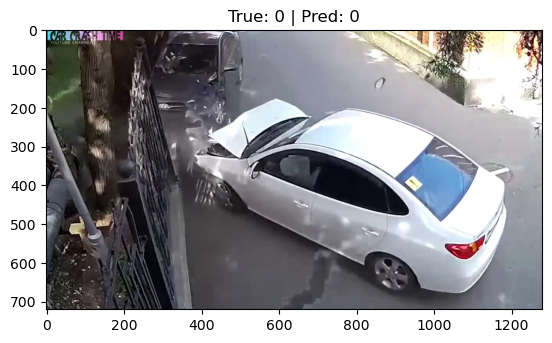

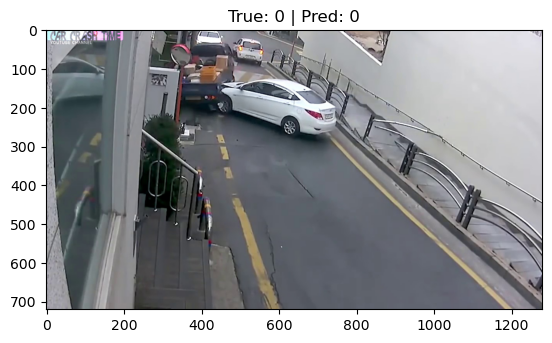

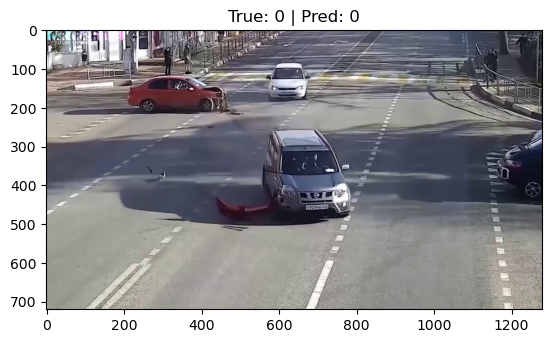

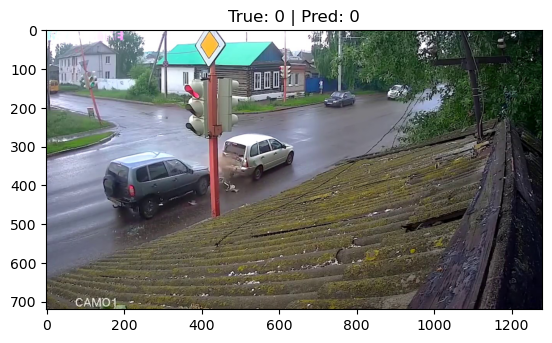

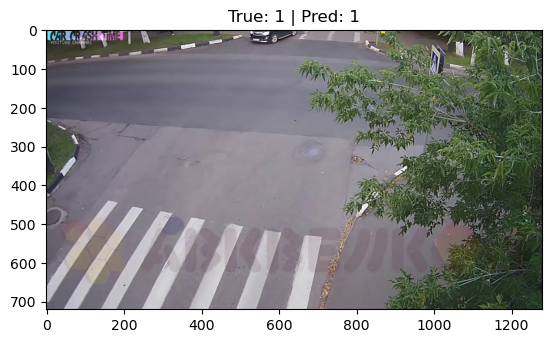

In [9]:
import torch
from transformers import CLIPProcessor, CLIPModel
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the CLIP model and processor from Hugging Face
model_name = "openai/clip-vit-base-patch16"
processor = CLIPProcessor.from_pretrained(model_name)
model = CLIPModel.from_pretrained(model_name)

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Function to extract image embeddings using CLIP
def extract_clip_embeddings(image_path):
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt", padding=True).to(device)

    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    # Normalize features to unit length
    image_features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)
    return image_features.cpu().numpy().flatten()

# Load data and generate embeddings
def load_data(data_dir):
    embeddings = []
    labels = []
    image_paths = []  # Store image paths for visualization

    for label, folder in enumerate(['Accident', 'Non Accident']):
        folder_path = os.path.join(data_dir, folder)

        for filename in os.listdir(folder_path):
            if filename.endswith(".jpg") or filename.endswith(".png"):
                image_path = os.path.join(folder_path, filename)

                embedding = extract_clip_embeddings(image_path)
                embeddings.append(embedding)
                labels.append(label)
                image_paths.append(image_path)  # Add image path to the list

    return np.array(embeddings), np.array(labels), image_paths

# Prepare the dataset
data_dir = "C:/Users/DELL/Desktop/accident detection/Accident-Detection-System-main/Accident-Detection-System-main/data/train"  # Replace with your dataset directory
X, y, image_paths = load_data(data_dir)

# Split data into training and testing
X_train, X_test, y_train, y_test, img_paths_train, img_paths_test = train_test_split(X, y, image_paths, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train a small classifier (SVM)
clf = SVC(kernel='linear', C=1)
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Evaluate performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# Optional: Display some test images with predictions
def show_predictions(img_paths, y_test, y_pred, n=5):
    for i in range(n):
        img_path = img_paths[i]
        img = Image.open(img_path)
        plt.imshow(img)
        plt.title(f"True: {y_test[i]} | Pred: {y_pred[i]}")
        plt.show()

# Show predictions on a few test images
show_predictions(img_paths_test, y_test, y_pred)


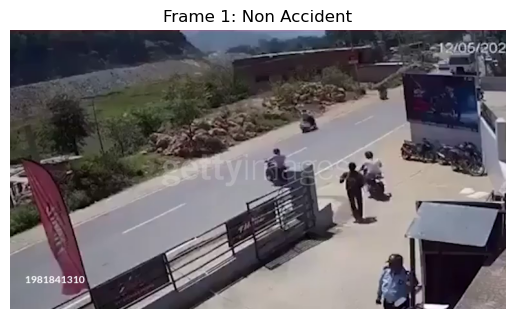

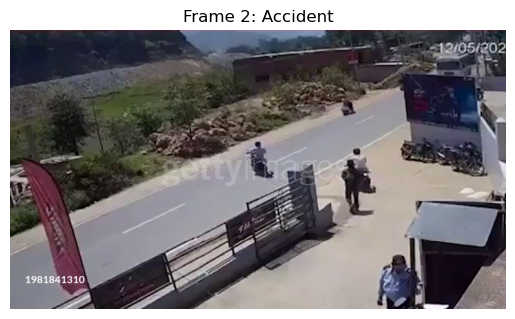

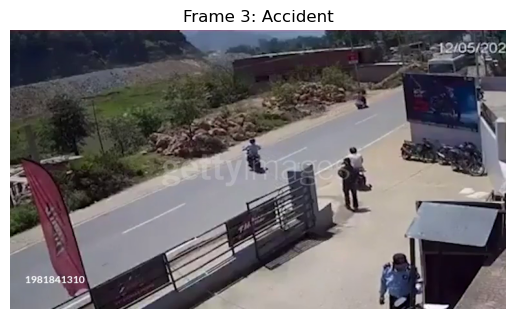

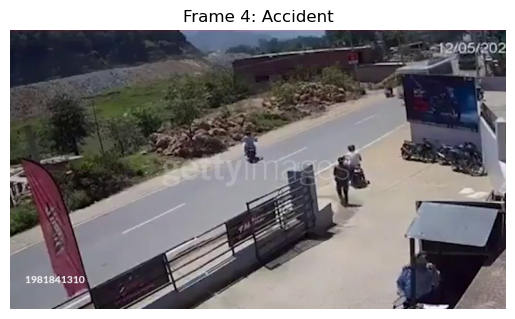

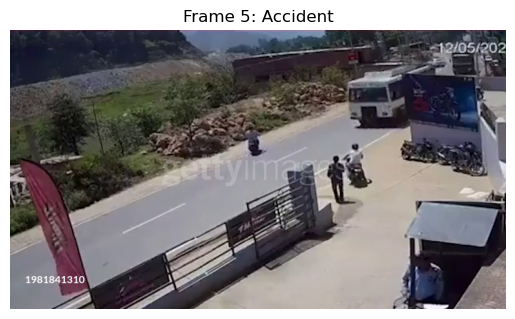

...

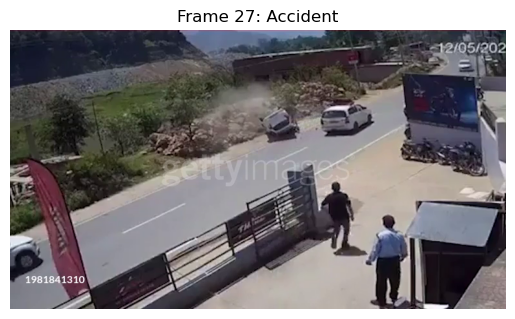

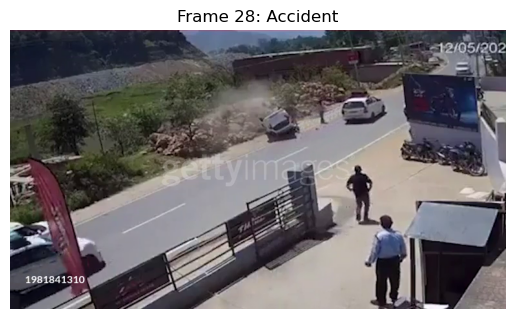

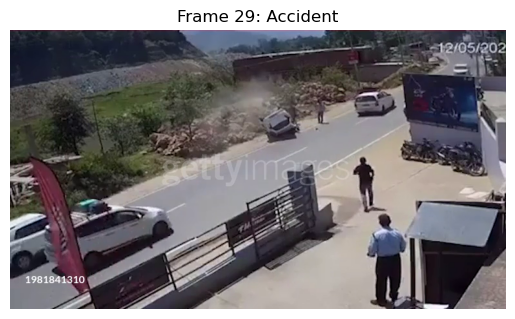

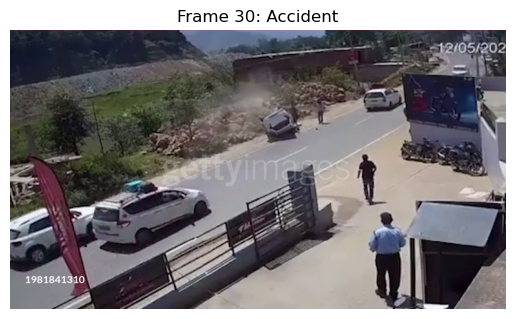

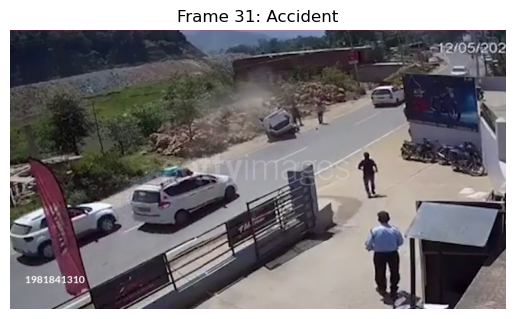

In [11]:
import cv2
import numpy as np
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Load the CLIP model and processor from Hugging Face
model_name = "openai/clip-vit-base-patch16"
processor = CLIPProcessor.from_pretrained(model_name)
model = CLIPModel.from_pretrained(model_name)

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Load the trained classifier and scaler (if saved)
# Example: clf = joblib.load('svm_classifier.pkl')
# scaler = joblib.load('scaler.pkl')
# Replace with actual trained classifier and scaler

# Function to extract image embeddings using CLIP
def extract_clip_embeddings(image):
    inputs = processor(images=image, return_tensors="pt", padding=True).to(device)

    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    # Normalize features to unit length
    image_features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)
    return image_features.cpu().numpy().flatten()

# Function to extract frames from a video
def extract_frames_from_video(video_path, frame_rate=1):
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Process the frame only if it is at the desired frame rate
        if frame_count % frame_rate == 0:
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame_rgb)
        
        frame_count += 1
    
    cap.release()
    return frames

# Function to classify frames in a video
def classify_video_frames(video_path, clf, scaler, frame_rate=1):
    frames = extract_frames_from_video(video_path, frame_rate)
    embeddings = []
    for frame in frames:
        # Convert frame (NumPy array) to a PIL Image for processing
        img = Image.fromarray(frame)
        embedding = extract_clip_embeddings(img)
        embeddings.append(embedding)

    # Standardize the features
    embeddings = np.array(embeddings)
    embeddings = scaler.transform(embeddings)

    # Classify each frame using the trained classifier
    frame_predictions = clf.predict(embeddings)

    return frame_predictions, frames

# Function to display video predictions
def display_video_predictions(frame_predictions, frames):
    for i, (frame, prediction) in enumerate(zip(frames, frame_predictions)):
        label = "Accident" if prediction == 1 else "Non Accident"
        plt.imshow(frame)
        plt.title(f"Frame {i+1}: {label}")
        plt.axis("off")
        plt.show()

# Path to your video file
video_path = "C:/Users/DELL/Desktop/accident detection/accident3.mp4"  # Replace with the path to your video

# Classify frames and get predictions
frame_predictions, frames = classify_video_frames(video_path, clf, scaler, frame_rate=30)  # Extract 1 frame per second

# Display predictions for the frames
display_video_predictions(frame_predictions, frames)


In [13]:
import cv2
import numpy as np
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Load the CLIP model and processor from Hugging Face
model_name = "openai/clip-vit-base-patch16"
processor = CLIPProcessor.from_pretrained(model_name)
model = CLIPModel.from_pretrained(model_name)

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Load the trained classifier and scaler (if saved)
# Example: clf = joblib.load('svm_classifier.pkl')
# scaler = joblib.load('scaler.pkl')
# Replace with actual trained classifier and scaler

# Function to extract image embeddings using CLIP
def extract_clip_embeddings(image):
    inputs = processor(images=image, return_tensors="pt", padding=True).to(device)

    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    # Normalize features to unit length
    image_features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)
    return image_features.cpu().numpy().flatten()

# Function to extract frames from a video
def extract_frames_from_video(video_path, frame_rate=1):
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Process the frame only if it is at the desired frame rate
        if frame_count % frame_rate == 0:
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame_rgb)
        
        frame_count += 1
    
    cap.release()
    return frames

# Function to classify frames in a video
def classify_video_frames(video_path, clf, scaler, frame_rate=1):
    frames = extract_frames_from_video(video_path, frame_rate)
    embeddings = []
    for frame in frames:
        # Convert frame (NumPy array) to a PIL Image for processing
        img = Image.fromarray(frame)
        embedding = extract_clip_embeddings(img)
        embeddings.append(embedding)

    # Standardize the features
    embeddings = np.array(embeddings)
    embeddings = scaler.transform(embeddings)

    # Classify each frame using the trained classifier
    frame_predictions = clf.predict(embeddings)

    return frame_predictions, frames

# Function to apply majority voting on frame predictions
def majority_vote_predictions(frame_predictions, window_size=5):
    """
    Apply majority voting to reduce false positives. 
    We look at every `window_size` frames and return the majority class.
    """
    voted_predictions = []
    for i in range(0, len(frame_predictions), window_size):
        window = frame_predictions[i:i + window_size]
        majority_class = np.bincount(window).argmax()
        voted_predictions.extend([majority_class] * len(window))  # Extend to match the length of the window

    return voted_predictions

# Function to save the classified video as a new output video
def save_classified_video(input_video_path, output_video_path, frame_predictions, frame_rate=30):
    cap = cv2.VideoCapture(input_video_path)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    
    # Get video width and height
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    out = cv2.VideoWriter(output_video_path, fourcc, frame_rate, (width, height))

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Ensure frame_predictions has the same length as the total number of frames
        if frame_count < len(frame_predictions):
            label = "Accident" if frame_predictions[frame_count] == 1 else "Non Accident"
        else:
            label = "Non Accident"  # Default to "Non-Accident" if there are fewer predictions than frames
        
        # Add text label to frame
        cv2.putText(frame, label, (10, height - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
        out.write(frame)

        frame_count += 1

    cap.release()
    out.release()

# Path to your video file
input_video_path = "C:/Users/DELL/Desktop/accident detection/accident3.mp4"  # Replace with the path to your video
output_video_path = "C:/Users/DELL/Desktop/accident detection/majority_voting_output_video.mp4"  # Path for the output video

# Classify frames and get predictions
frame_predictions, frames = classify_video_frames(input_video_path, clf, scaler, frame_rate=30)  # Extract 1 frame per second

# Apply majority voting to improve classification accuracy
frame_predictions_voted = majority_vote_predictions(frame_predictions, window_size=5)

# Ensure the length of predictions matches the total number of frames
# If necessary, pad or truncate predictions to match the length of the frames
if len(frame_predictions_voted) < len(frames):
    frame_predictions_voted.extend([frame_predictions_voted[-1]] * (len(frames) - len(frame_predictions_voted)))  # Extend with the last prediction
else:
    frame_predictions_voted = frame_predictions_voted[:len(frames)]  # Truncate if necessary

# Save the classified video
save_classified_video(input_video_path, output_video_path, frame_predictions_voted, frame_rate=30)

print(f"Classified video saved to: {output_video_path}")


Classified video saved to: C:/Users/DELL/Desktop/accident detection/majority_voting_output_video.mp4


In [14]:
#smoothing window
import cv2
import numpy as np
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Load the CLIP model and processor from Hugging Face
model_name = "openai/clip-vit-base-patch16"
processor = CLIPProcessor.from_pretrained(model_name)
model = CLIPModel.from_pretrained(model_name)

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Load the trained classifier and scaler (if saved)
# Example: clf = joblib.load('svm_classifier.pkl')
# scaler = joblib.load('scaler.pkl')
# Replace with actual trained classifier and scaler

# Function to extract image embeddings using CLIP
def extract_clip_embeddings(image):
    inputs = processor(images=image, return_tensors="pt", padding=True).to(device)

    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    # Normalize features to unit length
    image_features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)
    return image_features.cpu().numpy().flatten()

# Function to extract frames from a video
def extract_frames_from_video(video_path, frame_rate=1):
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Process the frame only if it is at the desired frame rate
        if frame_count % frame_rate == 0:
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame_rgb)
        
        frame_count += 1
    
    cap.release()
    return frames

# Function to classify frames in a video
def classify_video_frames(video_path, clf, scaler, frame_rate=1):
    frames = extract_frames_from_video(video_path, frame_rate)
    embeddings = []
    for frame in frames:
        # Convert frame (NumPy array) to a PIL Image for processing
        img = Image.fromarray(frame)
        embedding = extract_clip_embeddings(img)
        embeddings.append(embedding)

    # Standardize the features
    embeddings = np.array(embeddings)
    embeddings = scaler.transform(embeddings)

    # Classify each frame using the trained classifier
    frame_predictions = clf.predict(embeddings)

    return frame_predictions, frames

# Function to apply a simple smoothing technique over predictions
def smooth_predictions(frame_predictions, window_size=5):
    """
    This function smooths the predictions by averaging the results in a window.
    It gives more weight to predictions that are more consistent over time.
    """
    smoothed_predictions = []
    for i in range(len(frame_predictions)):
        start = max(0, i - window_size // 2)
        end = min(len(frame_predictions), i + window_size // 2 + 1)
        window = frame_predictions[start:end]
        
        # Majority vote (or most common prediction in the window)
        majority_class = np.bincount(window).argmax()
        smoothed_predictions.append(majority_class)

    return smoothed_predictions

# Function to save the classified video as a new output video
def save_classified_video(input_video_path, output_video_path, frame_predictions, frame_rate=30):
    cap = cv2.VideoCapture(input_video_path)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    
    # Get video width and height
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    out = cv2.VideoWriter(output_video_path, fourcc, frame_rate, (width, height))

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Ensure frame_predictions has the same length as the total number of frames
        if frame_count < len(frame_predictions):
            label = "Accident" if frame_predictions[frame_count] == 1 else "Non Accident"
        else:
            label = "Non Accident"  # Default to "Non-Accident" if there are fewer predictions than frames
        
        # Add text label to frame
        cv2.putText(frame, label, (10, height - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
        out.write(frame)

        frame_count += 1

    cap.release()
    out.release()

# Path to your video file
input_video_path = "C:/Users/DELL/Desktop/accident detection/accident3.mp4"  # Replace with the path to your video
output_video_path = "C:/Users/DELL/Desktop/accident detection/majority_voting_output_video2.mp4"  # Path for the output video

# Classify frames and get predictions
frame_predictions, frames = classify_video_frames(input_video_path, clf, scaler, frame_rate=30)  # Extract 1 frame per second

# Apply temporal smoothing (window size of 5 frames)
frame_predictions_smoothed = smooth_predictions(frame_predictions, window_size=5)

# Save the classified video
save_classified_video(input_video_path, output_video_path, frame_predictions_smoothed, frame_rate=30)

print(f"Classified video saved to: {output_video_path}")


Classified video saved to: C:/Users/DELL/Desktop/accident detection/majority_voting_output_video2.mp4


Test Accuracy: 83.65%


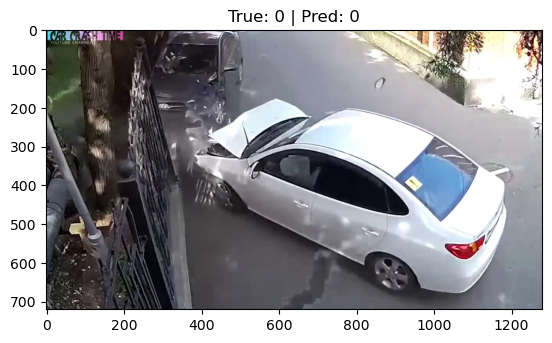

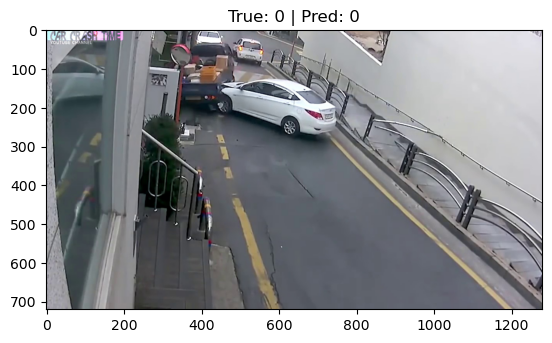

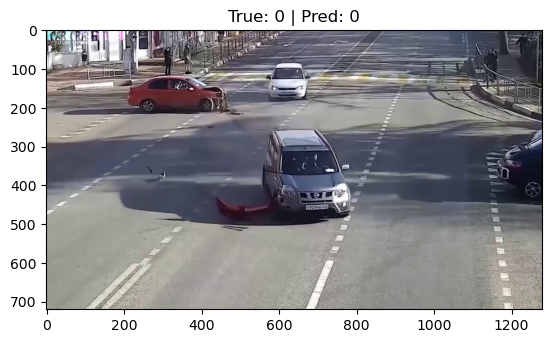

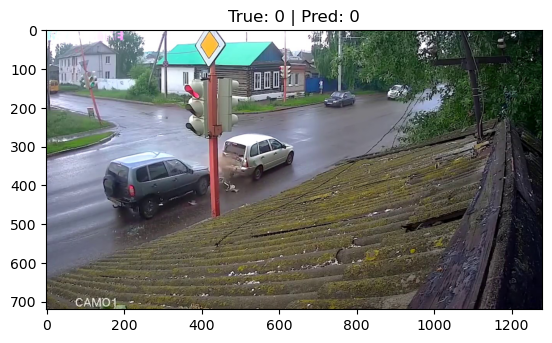

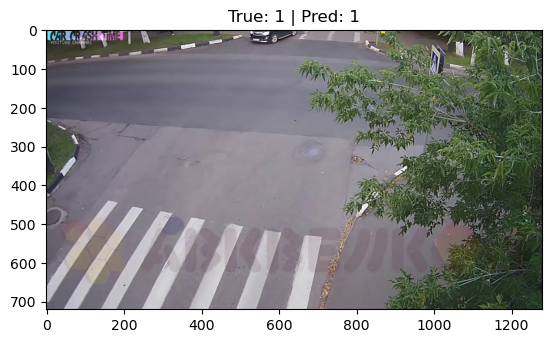

Classified video saved to: C:/Users/DELL/Desktop/accident detection/MAJORITY.mp4


In [20]:
import cv2
import numpy as np
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
import os
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Load the CLIP model and processor from Hugging Face
model_name = "openai/clip-vit-base-patch16"
processor = CLIPProcessor.from_pretrained(model_name)
model = CLIPModel.from_pretrained(model_name)

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Function to extract image embeddings using CLIP
def extract_clip_embeddings(image_array):
    """
    Extracts embeddings using CLIP directly from a PIL image or numpy array.
    """
    # Convert from numpy array to PIL image (if necessary)
    if isinstance(image_array, np.ndarray):  # If input is a NumPy array (e.g., frame from video)
        image = Image.fromarray(image_array)
    else:
        image = image_array.convert("RGB")  # If it's already a PIL Image, just convert to RGB
    
    inputs = processor(images=image, return_tensors="pt", padding=True).to(device)

    with torch.no_grad():
        outputs = model.get_image_features(**inputs)

    # Normalize features to unit length
    image_features = outputs / outputs.norm(p=2, dim=-1, keepdim=True)
    return image_features.cpu().numpy().flatten()

# Load data and generate embeddings
def load_data(data_dir):
    embeddings = []
    labels = []
    image_paths = []  # Store image paths for visualization

    for label, folder in enumerate(['Accident', 'Non Accident']):
        folder_path = os.path.join(data_dir, folder)

        for filename in os.listdir(folder_path):
            if filename.endswith(".jpg") or filename.endswith(".png"):
                image_path = os.path.join(folder_path, filename)

                # Open the image before passing it to the embedding extraction function
                image = Image.open(image_path)

                # Now pass the PIL image to extract_clip_embeddings
                embedding = extract_clip_embeddings(image)  # Pass the PIL image here
                embeddings.append(embedding)
                labels.append(label)
                image_paths.append(image_path)  # Add image path to the list

    return np.array(embeddings), np.array(labels), image_paths

# Prepare the dataset
data_dir = "C:/Users/DELL/Desktop/accident detection/Accident-Detection-System-main/Accident-Detection-System-main/data/train"  # Replace with your dataset directory
X, y, image_paths = load_data(data_dir)

# Split data into training and testing
X_train, X_test, y_train, y_test, img_paths_train, img_paths_test = train_test_split(X, y, image_paths, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train a small classifier (SVM)
clf = SVC(kernel='linear', C=1)
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Evaluate performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# Optional: Display some test images with predictions
def show_predictions(img_paths, y_test, y_pred, n=5):
    for i in range(n):
        img_path = img_paths[i]
        img = Image.open(img_path)
        plt.imshow(img)
        plt.title(f"True: {y_test[i]} | Pred: {y_pred[i]}")
        plt.show()

# Show predictions on a few test images
show_predictions(img_paths_test, y_test, y_pred)


# Function to classify frames in a video
def classify_video_frames(video_path, clf, scaler, frame_rate=1):
    frames = extract_frames_from_video(video_path, frame_rate)
    embeddings = []
    for frame in frames:
        # Pass the frame (as NumPy array) to extract features
        embedding = extract_clip_embeddings(frame)
        embeddings.append(embedding)

    # Standardize the features
    embeddings = np.array(embeddings)
    embeddings = scaler.transform(embeddings)

    # Classify each frame using the trained classifier
    frame_predictions = clf.predict(embeddings)

    return frame_predictions, frames

# Function to extract frames from a video
def extract_frames_from_video(video_path, frame_rate=1):
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Process the frame only if it is at the desired frame rate
        if frame_count % frame_rate == 0:
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame_rgb)
        
        frame_count += 1
    
    cap.release()
    return frames


# Function to save the classified video as a new output video
def save_classified_video(input_video_path, output_video_path, frame_predictions, frame_rate=30):
    cap = cv2.VideoCapture(input_video_path)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    
    # Get video width and height
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    out = cv2.VideoWriter(output_video_path, fourcc, frame_rate, (width, height))

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Ensure frame_predictions has the same length as the total number of frames
        if frame_count < len(frame_predictions):
            label = "Accident" if frame_predictions[frame_count] == 1 else "Non Accident"
        else:
            label = "Non Accident"  # Default to "Non-Accident" if there are fewer predictions than frames
        
        # Add text label to frame
        cv2.putText(frame, label, (10, height - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
        out.write(frame)

        frame_count += 1

    cap.release()
    out.release()

# Path to your video file
input_video_path = "C:/Users/DELL/Desktop/accident detection/accident3.mp4"  # Replace with the path to your video
output_video_path = "C:/Users/DELL/Desktop/accident detection/MAJORITY.mp4"  # Path for the output video

# Classify frames and get predictions
frame_predictions, frames = classify_video_frames(input_video_path, clf, scaler, frame_rate=30)  # Extract 1 frame per second

# Save the classified video
save_classified_video(input_video_path, output_video_path, frame_predictions, frame_rate=30)

print(f"Classified video saved to: {output_video_path}")
